In [1]:
using Pkg
Pkg.activate(".")
# Pkg.resolve()
# Pkg.instantiate()

  Activating project at `c:\Users\maty\PycharmProjects\pescado-controlado`


In [2]:
Pkg.add(url="https://github.com/maxhcohen/VectorFieldPlots.jl.git")

    Updating git-repo `https://github.com/maxhcohen/VectorFieldPlots.jl.git`
   Resolving package versions...
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Project.toml`
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Manifest.toml`


In [3]:
Pkg.add("Plots")
Pkg.add("DifferentialEquations")
Pkg.add("IJulia")
Pkg.add("LaTeXStrings")

   Resolving package versions...
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Project.toml`
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Project.toml`
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Project.toml`
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Project.toml`
  No Changes to `C:\Users\maty\PycharmProjects\pescado-controlado\Manifest.toml`


In [4]:
using Plots, DifferentialEquations

# Análisis cualitativo de la dinámica del modelo

*Parámetros a utilizar:*
- $r$: Tasa de crecimiento intrínseco de la población de presas
- $K$: Capacidad de soporte del medio ambiente
- $m$: Tasa de mortalidad natural de la especie depredadora
- $b$: Eficiencia de conversión
- $a$: Eficiencia de búsqueda del depredador
- $q_1$: Coeficiente de capturabilidad de la especie presa
- $q_2$: Coeficiente de capturabilidad de la especie depredadora

La dinámica del modelo está dada por

$$
\begin{cases}
    \dot x = rx(1-\frac{x}{K}) - axy-q_1xE\\
    \dot y = abxy-my-q_2yE
\end{cases}
$$
para analizar el comportamiento del sistema, consideramos que el control cumple $E(t) \equiv E$

In [5]:
# Consideramos p vector de parámetros
# p = [r K m b a q_1 q_2 E]

# Función para usar con DifferentialEquations
function fish!(du, u, p, t)
    du[1] = p[1] * u[1] * (1 - u[1] / p[2]) - p[5] * u[1] * u[2] - p[6] * u[1] * p[8]
    du[2] = p[5] * p[4] * u[1] * u[2] - p[3] * u[2] - p[7] * u[2] * p[8]
end

# Función para plotear usando VectorFieldPlots
function fish(x, y, p)
    out = zeros(2)
    out[1] = p[1] * x * (1 - x / p[2]) - p[5] * x * y - p[6] * x * p[8]
    out[2] = p[5] * p[4] * x * y - p[3] * y - p[7] * y * p[8]
    return out
end

fish (generic function with 1 method)

## Todos los parámetros valen 1 (excepto $K$)

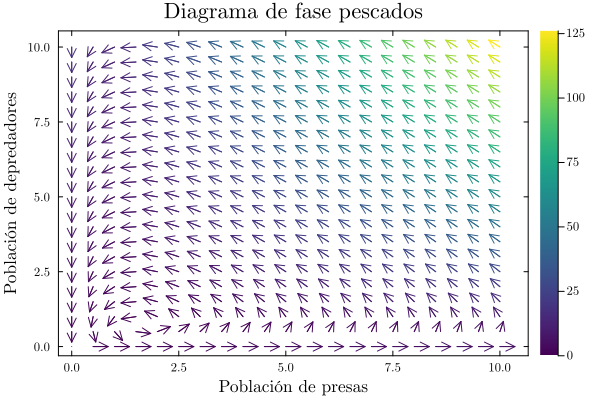

In [61]:
using VectorFieldPlots, LaTeXStrings
default(grid=false, framestyle=:box, label="", fontfamily="Computer Modern")
# Definición de parámetros
params1 = [1.0, 100.0, 1.0, 1.0, 1.0, 0.3, 0.6, 1.0]

# Definir campo a plotear
f(x, y) = fish(x, y, params1)
xs = 0:0.5:10
ys = 0:0.5:10


fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_1.pdf")

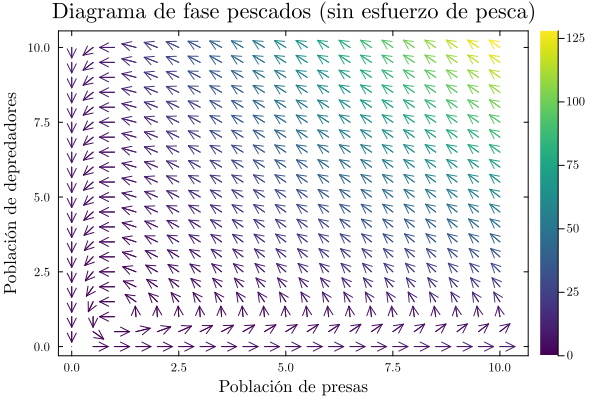

In [62]:
p = copy(params1)
p[8] = 0
f(x, y) = fish(x, y, p)
xs = 0:0.5:10
ys = 0:0.5:10


fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados (sin esfuerzo de pesca)")
#savefig(fig, "dinamica/diag_sinE.pdf")

Mientras haya esfuerzo de pesca, el único equilibrio es el $(0,0)$. Se simula el sistema sin esfuerzo de pesca para $T$ grande

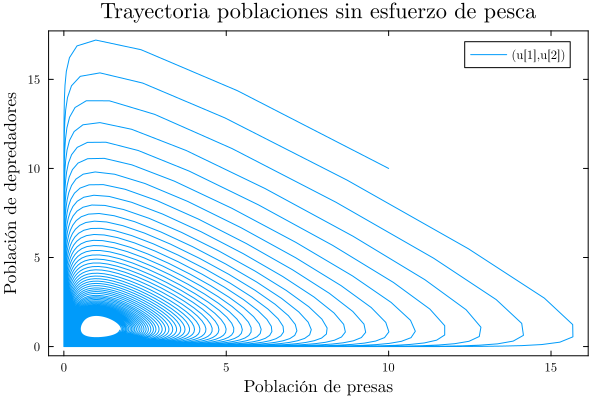

In [66]:
x_0 = [10, 10]
prob = ODEProblem(fish!, x_0, (0, 500), p)
sol = solve(prob)
plot(sol, idxs=(1, 2))
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Trayectoria poblaciones sin esfuerzo de pesca")
#savefig("dinamica/trayectoria_phase.pdf")

Plots.AnimatedGif("c:\\Users\\maty\\PycharmProjects\\pescado-controlado\\gifs\\params_1.gif")
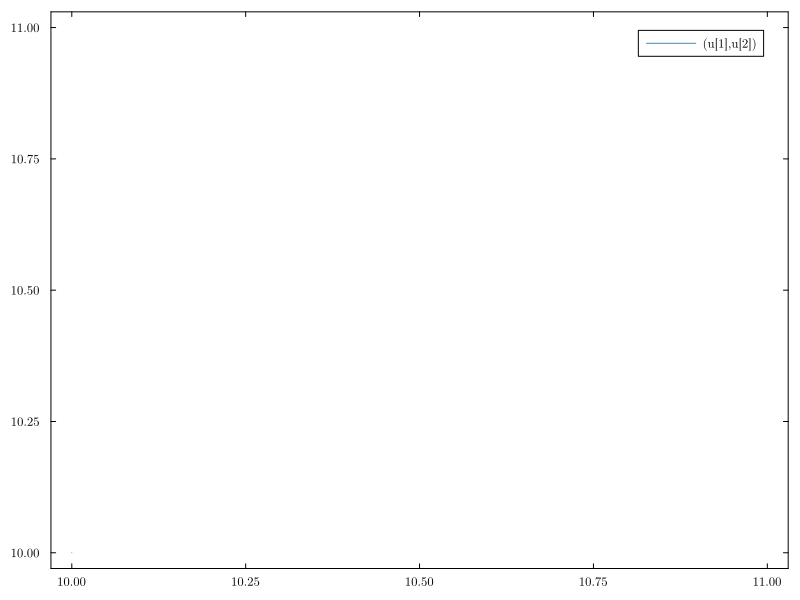

In [38]:
animate(sol, "gifs/params_1.gif", every=3, idxs=(1, 2), size=(800, 600))

## Variar valores de $r$ y $m$
Probar con los crecimientos y muertes naturales de las especies para desplazar el equilibrio con y sin pesca

- $r$: Tasa de crecimiento intrínseco de la población de presas

- $m$: Tasa de mortalidad natural de la especie depredadora



## $r:m = 2:1$

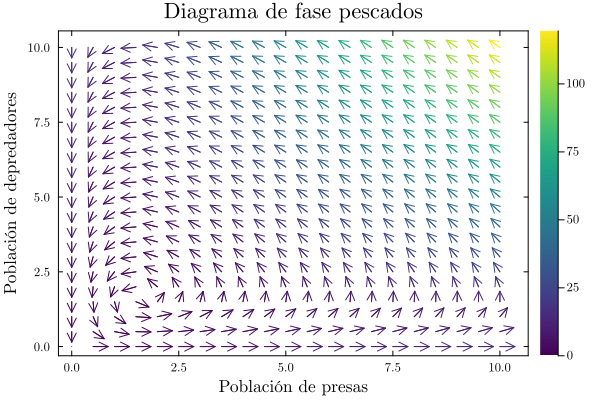

In [67]:
r = 2
m = 1
params2 = copy(params1)
params2[8] = 1
params2[1] = r
params2[3] = m

f(x, y) = fish(x, y, params2)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_3_rr_m.pdf")

In [40]:
x_0 = [10, 10]
prob = ODEProblem(fish!, x_0, (0, 500), params2)
sol = solve(prob)
plot(sol, idxs=(1, 2))
savefig("dinamica/trayectoria_3_rr_m.pdf")

"c:\\Users\\maty\\PycharmProjects\\pescado-controlado\\dinamica\\trayectoria_3_rr_m.pdf"

## $r:m = 5/2$

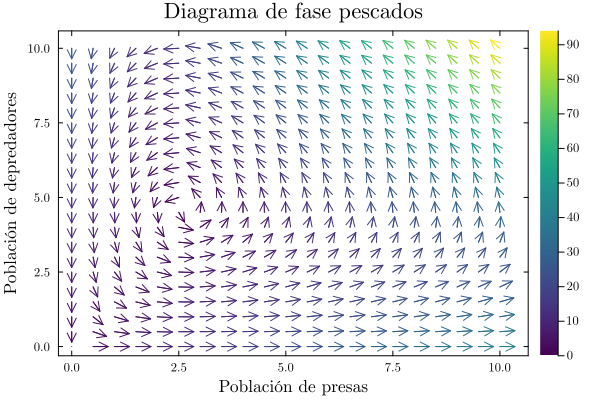

In [68]:
r = 5
m = 2
params2 = copy(params1)
params2[8] = 1
params2[1] = r
params2[3] = m

f(x, y) = fish(x, y, params2)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_4_r5_m2.pdf")

## $r:m = 1/2$


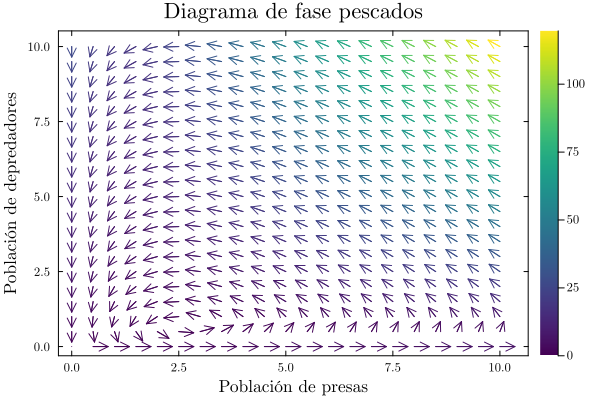

In [69]:
r = 1
m = 2
params2 = copy(params1)
params2[8] = 1
params2[1] = r
params2[3] = m

f(x, y) = fish(x, y, params2)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_5_r1_m2.pdf")

## Juego con $q_1$ y $q_2$

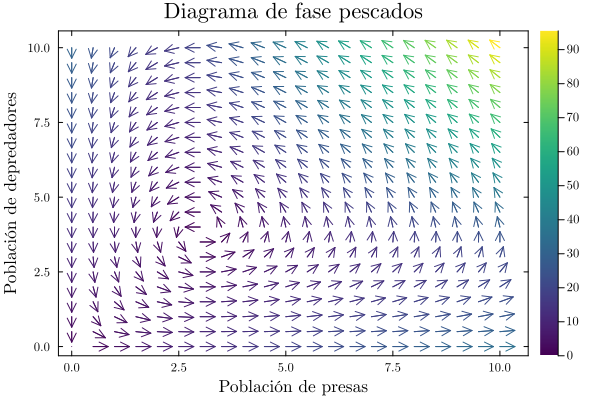

In [70]:
r = 5
m = 2
params3 = copy(params1)
params3[8] = 1
params3[1] = r
params3[3] = m
q1 = 1
q2 = 1
params3[6] = q1
params3[7] = q2
f(x, y) = fish(x, y, params3)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_6_r5_m2_q1_q2.pdf")

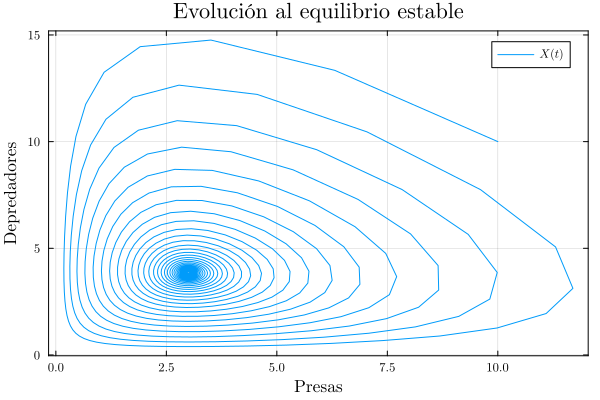

In [71]:
prob = ODEProblem(fish!, x_0, (0, 500), params3)
sol = solve(prob)
plot(sol, idxs=(1, 2), title="Evolución al equilibrio estable", ylabel="Depredadores", xlabel="Presas", label=L"$X(t)$", grid=true)
#savefig("dinamica/evolucion_equilibrio_estable7.pdf")

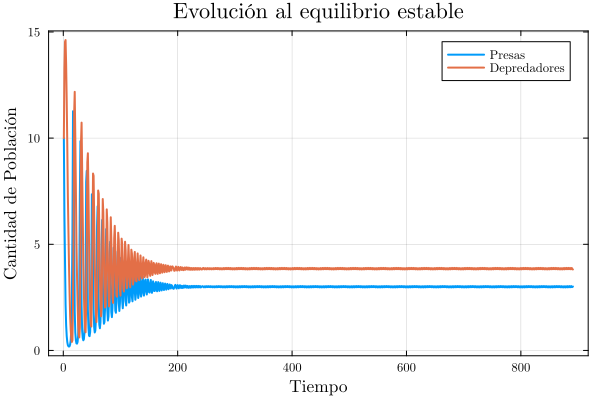

In [74]:
plot(sol[1,:], xlabel="Tiempo", ylabel="Cantidad de Población", label="Presas",title="Evolución al equilibrio estable", lw=2, grid=true)
plot!(sol[2,:], label="Depredadores", lw=2)
#savefig("dinamica/evolucion_equilibrio_estable_xy8.pdf")

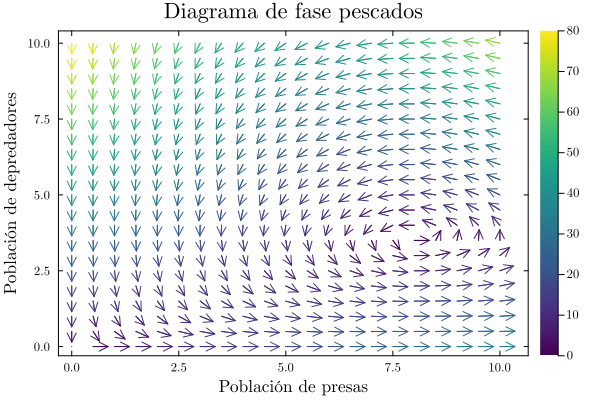

In [75]:
r = 5
m = 2
params3 = copy(params1)
params3[8] = 1
params3[1] = r
params3[3] = m
q1 = 1
q2 = 6
params3[6] = q1
params3[7] = q2
f(x, y) = fish(x, y, params3)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_9_q11_q26.pdf")


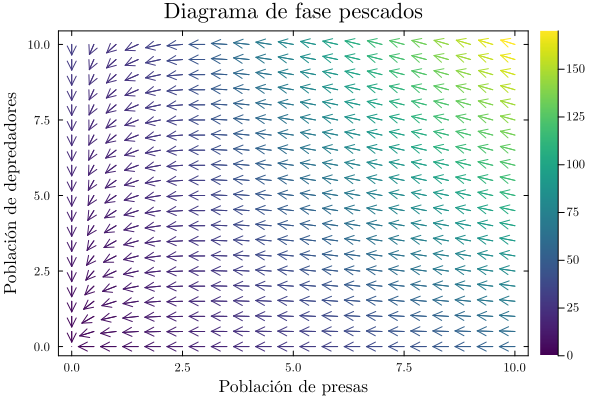

In [76]:
r = 5
m = 2
params3 = copy(params1)
params3[8] = 1
params3[1] = r
params3[3] = m
q1 = 10
q2 = 1
params3[6] = q1
params3[7] = q2
f(x, y) = fish(x, y, params3)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_10_q110_q21.pdf")

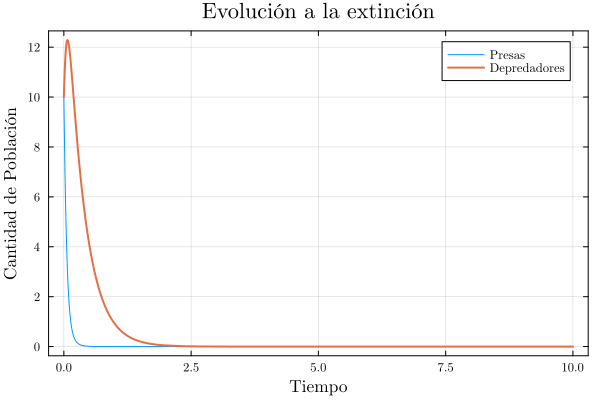

In [82]:
prob = ODEProblem(fish!, [10,10], (0, 500), params3)
sol = solve(prob)
plot(t -> sol(t)[1], 0, 10,title="Evolución a la extinción", xlabel="Tiempo", ylabel = "Cantidad de Población", label="Presas", grid=true)
plot!(t -> sol(t)[2], 0, 10, lw=2, label="Depredadores")
#savefig("dinamica/evolucion_extincion11.pdf")

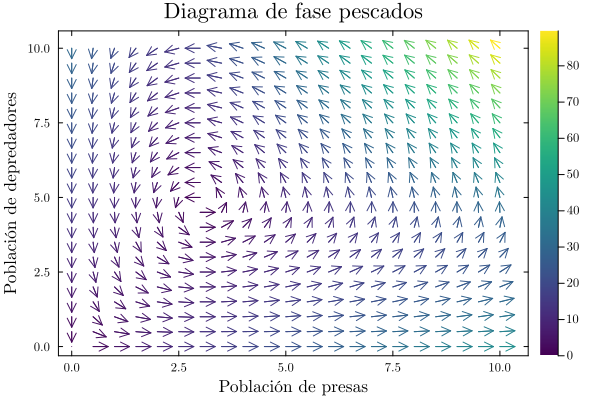

In [83]:
r = 5
m = 2
params3 = copy(params1)
params3[8] = 1
params3[1] = r
params3[3] = m
q1 = 0.1
q2 = 1
params3[6] = q1
params3[7] = q2
f(x, y) = fish(x, y, params3)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_12_q101_q21.pdf")

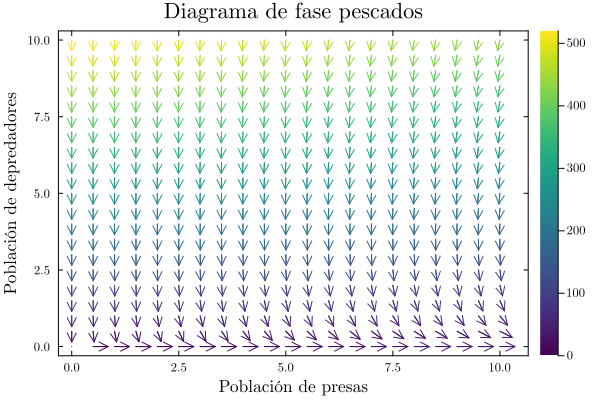

In [84]:
r = 5
m = 2
params3 = copy(params1)
params3[8] = 1
params3[1] = r
params3[3] = m
q1 = 1
q2 = 50
params3[6] = q1
params3[7] = q2
f(x, y) = fish(x, y, params3)
fig = plot_vector_field(xs, ys, f, scale=0.35)
xlabel!("Población de presas")
ylabel!("Población de depredadores")
title!("Diagrama de fase pescados")
#savefig(fig, "dinamica/diag_13_q11_q250.pdf")


$$\left(\frac{m + q_2 E}{ab}, 0\right)$$

In [56]:
(params3[5] + params3[7] * params3[8])/(params3[4] * params3[3])

25.5

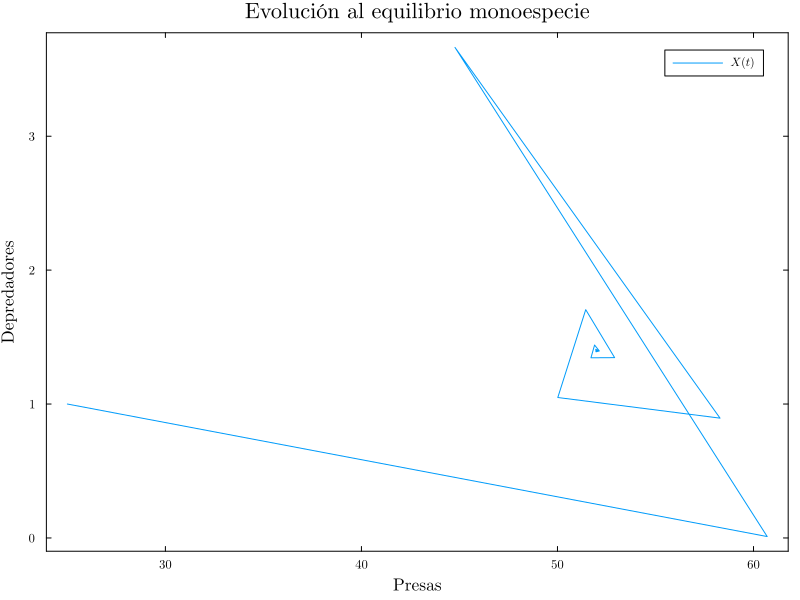

In [87]:
prob = ODEProblem(fish!, [25,1], (0, 500), params3)
sol = solve(prob)
plot(sol, idxs=(1, 2), size=(800,600), title="Evolución al equilibrio monoespecie", ylabel="Depredadores", xlabel="Presas", label=L"$X(t)$")
#savefig("dinamica/evolucion_equilibrio_mono14.pdf")

Aumentar el parámetro $q_2$ (haciendo que los depredadores sean mas capturables) resulta en un desplazamiento del equilibrio del sistema a uno donde hay mas presas. Al aumentar $q_2$ mas allá de 20 se genera una dinámica que promueve un sistema sin población de depredadores y crecimiento no acotado de presas. Para comprobar que pasa en estos casos se realizan simulaciones.

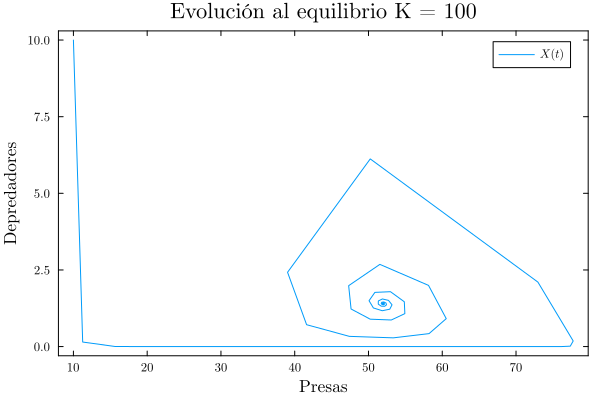

In [96]:
params3[2] = 100
prob_k = ODEProblem(fish!, [10.0, 10.0], (0, 100), params3)
sol_k = solve(prob_k)
plot(sol_k, idxs=(1, 2), title="Evolución al equilibrio K = 100", ylabel="Depredadores", xlabel="Presas", label=L"$X(t)$")
#savefig("dinamica/trayectoria_mucha_presa14.pdf")

El crecimiento de presas es constante hasta que llegan a acercarse al límite del entorno. Veamos que pasa si se aumenta mas

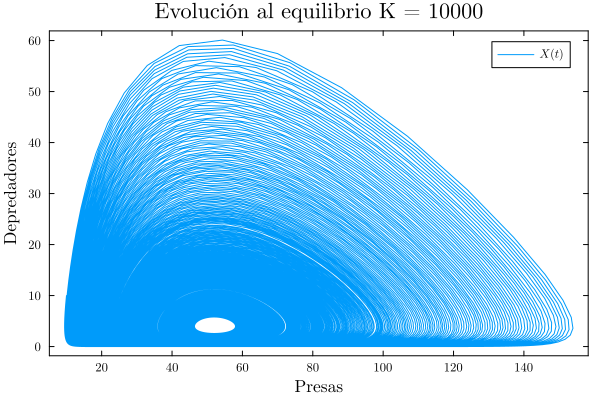

In [97]:
params3[2] = 10000
prob_k = ODEProblem(fish!, [10.0, 10.0], (0, 200), params3)
sol_k = solve(prob_k)
plot(sol_k, idxs=(1, 2), title="Evolución al equilibrio K = 10000", ylabel="Depredadores", xlabel="Presas", label=L"$X(t)$")
#savefig("dinamica/trayectoria_mucha_presa_t14.pdf")

El sistema llega a tener mas presas, pero el equilibrio no se desplaza.

# Matraca, búsqueda de puntos de equilibrio

Donde la segunda ecuación indica $x = \frac{m + q_2 E}{ab} \vee y = 0$.

Si tomamos y = 0, al reemplazarlo en la primera ecuación se obtiene: 
$$
\begin{equation}
    0 = x(r-\frac{rx}{K} - q_1E)
\end{equation}
$$
De donde podemos ver que $x = 0 \vee x = \frac{K(r-q_1 E)}{r}$, por lo que dos puntos de equilibrio son 

$$
P_1 = (0, 0) \quad P_2 = \left(\frac{K(r-q_1 E)}{r}, 0\right)
$$

Al trabajar la primera ecuación en el caso $x = \frac{m + q_2 E}{ab}$, se obtiene:
$$
y = \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right)
$$
obteniendo el último punto de equilibrio:
$$
P_3 = \left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right)
$$

## Linealización del sistema


Para obtener la linealización en torno al equilibrio, se calcula $A = \nabla_x f$ y $B = \nabla_E f$

$$
A(x,y) =
\begin{pmatrix}
r - \dfrac{2 r x}{K} - a y - q_1 E & -a x \\
a b y & a b x - m - q_2 E
\end{pmatrix}
\quad
B(x,y) =
\begin{pmatrix}
- q_1 x \\
- q_2 y
\end{pmatrix}
$$

De esta forma, podemos escribir la linealización del sistema en torno a un punto de equilibrio $(x^*, y^*)$ como
$$
\begin{pmatrix}
\dot{x} \\
\dot{ y}
\end{pmatrix} =
A(x^*,y^*) \cdot
\begin{pmatrix}
 x \\
 y
\end{pmatrix} +
B(x^*,y^*) \cdot
E
$$

### Evaluación de la linealización en los puntos de equilibrio


Evaluando en $P_1 = (0, 0)$
$$
A(0,0) =
\begin{pmatrix}
r - q_1 E & 0 \\
0 & - m - q_2 E
\end{pmatrix}
\quad
B(0,0) =
\begin{pmatrix}
0 \\
0
\end{pmatrix}
$$
Evaluando en $P_2 = \left(\frac{K(r-q_1 E)}{r}, 0\right)$
$$
A\left(\frac{K(r-q_1 E)}{r}, 0\right) =
\begin{pmatrix}
- (r - q_1 E) & -a \frac{K(r-q_1 E)}{r} \\
0 & a b \frac{K(r-q_1   E)}{r} - m - q_2 E
\end{pmatrix}
\quad
B\left(\frac{K(r-q_1 E)}{r}, 0\right) =
\begin{pmatrix}
- q_1 \frac{K(r-q_1 E)}{r} \\
0
\end{pmatrix}
$$
Evaluando en $P_3 = \left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right)$
$$
A\left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right) =
\begin{pmatrix}
- \dfrac{r(m + q_2 E)}{K ab} & - \dfrac{m + q_2 E}{b} \\
b \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) & 0
\end{pmatrix}
$$
$$
B\left(\frac{m + q_2 E}{ab}, \frac{1
}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right) =
\begin{pmatrix}
- q_1 \frac{m + q_2 E}{ab} \\
- q_2 \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right)
\end{pmatrix}
$$


## Análisis de controlabilidad y observabilidad de los puntos de equilibrio
Se analiza la controlabilidad y observabilidad de los puntos de equilibrio en función de los parámetros del sistema.
La observabilidad se considera para el siguiente observador:
$$
y =

\begin{pmatrix}
0 & 1\\
\end{pmatrix}
x
$$
### Punto de equilibrio $P_1 = (0, 0)$
Para calcular la matriz de Kalman se nota que $AB = 0$, por lo que
$$
\mathcal{K} = \begin{pmatrix}
0 & 0\\
0 & 0\\
\end{pmatrix}
$$
evidentemente $K$ no es de rango completo, por lo que el sistema no es controlable en este punto de equilibrio. Por otro lado, la matriz de observabilidad es
$$
\mathcal{O} = \begin{pmatrix}
0 & 1\\
0 & - m - q_2 E\\
\end{pmatrix}
$$
que tampoco es de rango completo, por lo que el sistema no es observable en este punto de equilibrio.


### Punto de equilibrio $P_2 = \left(\frac{K(r-q_1 E)}{r}, 0\right)$
Calculamos $AB$
$$
AB =
\begin{pmatrix}
q_1\frac{K(r-q_1 E)^2}{r} \\
0
\end{pmatrix}
$$
Por lo tanto, la matriz de Kalman es
$$
\mathcal{K} = \begin{pmatrix}
-q_1\frac{K(r-q_1 E)}{r} & q_1\frac{K(r-q_1 E)^2}{r}\\
0 & 0\\
\end{pmatrix}
$$
evidentemente $K$ no es de rango completo, por lo que el sistema no es controlable en este punto de equilibrio. Por otro lado, la matriz de observabilidad es
$$
\mathcal{O} = \begin{pmatrix}
0 & 1\\
0 & a b \frac{K(r-q_1   E)}{r} - m - q_2 E
\end{pmatrix}
$$
que tampoco es de rango completo, por lo que el sistema no es observable en este punto de equilibrio.
### Punto de equilibrio $P_3 = \left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right)$  
Calculamos $AB$

$$
AB = \begin{pmatrix}
q_1 \frac{r(m + q_2 E)^2}{K a^2b^2} + q_2 \frac{(m + q_2 E)}{ab} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \\
- q_1 \frac{(m + q_2 E)}{a} \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right)
\end{pmatrix}
$$
con lo que la matriz de Kalman es
$$
\mathcal{K} = \begin{pmatrix}
- q_1 \frac{m + q_2 E}{ab} & q_1 \frac{r(m + q_2 E)^2}{K a^2b^2} + q_2 \frac{(m + q_2 E)}{ab} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \\
- q_2 \frac{1}{a} \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) & - q_1 \frac{(m + q_2 E)}{a} \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right)
\end{pmatrix}
$$
Calculando el determinante de $\mathcal{K}$ se obtiene

$$
\det(\mathcal{K}) = \dfrac{m+q_2 E}{a^2 b} \left(r -\frac{r (m+q_2 E)}{K a b} - q_1 E\right) \left(q_1^2 + q_1 q_2 \frac{r(m + q_2 E)}{K a b} + q_2^2 (m + q_2 E)\right)
$$
El único término que podría anularse es el segundo factor, ya que los otros dos son siempre positivos para valores positivos de los parámetros del sistema. Por ello el sistema es localmente controlable en torno a este punto siempre que:
$$
r -\frac{r (m+q_2 E)}{K a b} - q_1 E \neq 0
$$

Por otro lado,
$$
CA = \begin{pmatrix} 0 & 1\end{pmatrix}
\cdot
\begin{pmatrix}
- \dfrac{r(m + q_2 E)}{K ab} & - \dfrac{m + q_2 E}{b} \\
b \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) & 0
\end{pmatrix}
=\begin{pmatrix}
b \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) & 0
\end{pmatrix}
$$
con lo que la matriz de observabilidad es
$$
\mathcal{O} = \begin{pmatrix}
0 & 1\\
b \left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) & 0
\end{pmatrix}
$$
que es de rango completo siempre que
$$\left( r - \dfrac{r(m + q_2 E)}{K ab} - q_1 E \right) \neq 0$$
La misma condición que para la controlabilidad.

## Equilibrio Bioestable

Teniendo lo anterior, veremos ahora como cambian las condiciones de controlabilidad al incluir y considerar la ecuación que representa la ganancia junto con la dinámica de una forma diferente, es decir la ecuación: 

$$
    \pi_t = \pi_t(x, y, E) = (p_1q_1x + p_2q_2y - c)E
$$

Y en la dinámica trabajada:

$$
\begin{cases}
    0 = x(r-\frac{rx}{K} - ay - q_1E)\\
    0 = y(abx-m-q_2E)
\end{cases}
$$
Se asume  $x\neq 0$ y $y\neq 0$, obteniendo así: 
$$
\begin{cases}
    0 = r-\frac{rx}{K} - ay - q_1E\\
    0 = abx-m-q_2E
\end{cases}
$$

Donde como $q_1$ y $q_2$ son los coeficientes de capturabiolidad, y se asume que se captura a ambas especies, estos son diferentes de 0, con lo cual al despejar E se obtiene:

$$
\begin{cases}
    E = \frac{r}{q_1}-\frac{rx}{Kq_1} - \frac{ay}{q_1} \\
    E = \frac{abx}{q_2}-\frac{m}{q_2}
\end{cases}
$$

Con lo cual, podemos igualar el lado izquierdo de ambas ecuaciones resultando así en la siguiente ecuación:

$$
\begin{align*}
   \frac{abx}{q_2}-\frac{m}{q_2} &= \frac{r}{q_1}-\frac{rx}{Kq_1} - \frac{ay}{q_1} \\
   0 &= -\frac{abx}{q_2}+\frac{m}{q_2}+ \frac{r}{q_1}-\frac{rx}{Kq_1} - \frac{ay}{q_1} \\
   0 &= x\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right) + y\left(\frac{a}{q_1}\right) - \left(\frac{m}{q_2} + \frac{r}{q_1}\right)\\
\end{align*}
$$

Donde como condición tenemos que el bioma soporta una cantidad de peces de la primera especie $0\leq x \leq K$ 


Además para que esto sea economico y biológicamente factible se requiere que se cumplan un par de condiciones, es decir que todas las constantes asumidas en el problema sean mayores a 0: 

$$
    a,b,r,K,q1​,q2​,m>0
$$

Por otro lado, con las ecuaciones anteriores se puede dejar E en función de x, e y igualmente, con lo cual: 


$$
\begin{align*}
    E &= \frac{abx}{q_2}-\frac{m}{q_2}\\
    y &= -\frac{q_1x}{a}\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right)  + \frac{q_1}{a}\left(\frac{m}{q_2} + \frac{r}{q_1}\right)\\
\end{align*}
$$

Ahora bien, desde una perspectiva de control E puede ser negativo, pero desde una biológica y económica, debieramos tener $E(t) \geq 0$, ya que si se tiene lo contrario tendríamos un esfuerzo negativo (reponemos peces en vez de capturarlo). 

Con ello, se tiene 

$$
\begin{align*}
    0 \leq \frac{abx}{q_2}-\frac{m}{q_2}\\
    \frac{m}{ab} \leq x\\
\end{align*}
$$

Obteniendo así, la cota inferior para x, donde E es mayor igual que 0, ahora veamos que sucede con y.

Por otro lado, como $y\geq 0$, se tiene de la segunda ecuación una cota para x, ya que como las constantes son positivas:

$$
\begin{align}
    0 &\leq -\frac{ax}{q_1}\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right)  + \frac{a}{q_1}\left(\frac{m}{q_2} + \frac{r}{q_1}\right)\\
    x &\leq \frac{\left(\frac{m}{q_2} + \frac{r}{q_1}\right)}{\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right)} = \frac{\left(\frac{mq_1 + rq_2}{q_1q_2}\right)}{\left(\frac{Kq_1ab+rq_2}{Kq_1q_2}\right)} = \frac{K(mq_1 + rq_2)}{Kq_1ab+rq_2} = D \\
\end{align}
$$

A partir de esto se puede observar que $x \in [\frac{m}{ab}, min\{D,K\}]$, a partir de lo cual, si este intervalo es diferente de vacio, entonces se obtiene una familia de equilibrios (x,y). Ahora para encontrar el equilibrio bioeconómico, tomamos como hipótesis extra que $\pi = 0$ con lo cual tenemos dos opciones al considerar: 

$$
\pi_t = (p_1q_1x + p_2q_2y - c)E
$$

es decir:

$$
    E = 0 \lor (p_1q_1x + p_2q_2y - c) = 0
$$

En el primer caso, es decir E = 0, tenemos que no hay pesca, es decir los puntos de equilibrio son los biológicos, revisados anteriormente. Por ello, el caso interesante al utilizar esta nueva ecuación como parte de los datos es el segundo caso, es decir:

$$
\begin{align*}
    c &= p_1q_1x + p_2q_2y\\
    \left(\frac{m}{q_2} + \frac{r}{q_1}\right) &= x\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right) + y\left(\frac{a}{q_1}\right)\\
\end{align*}
$$

Donde al tener 2 ecuaciones y 2 incógnitas podemos resolver el sistema.

Para resolver este sistema se utilizará la regla de Cramer, es decir, de forma matricial, para ello se definirán las constantes: 

$$
\begin{align*}
    A = \left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right)\text{, }\quad B=\left(\frac{a}{q_1}\right)\text{, }\quad C=\left(\frac{m}{q_2} + \frac{r}{q_1}\right)
\end{align*}
$$

Con ello, en forma matricial el sistema queda de la forma: 

$$
\begin{align*}
    \begin{pmatrix}
        p_1q_1 & p_2q_2 \\
        A & B
    \end{pmatrix}
    \begin{pmatrix}
        x \\
        y
    \end{pmatrix}
    = 
    \begin{pmatrix}
        c \\
        C
    \end{pmatrix}
\end{align*}
$$

Donde los puntos críticos se obtienen con la regla de Cramer: 

$$
\begin{align*}
    x^* = \frac{det\begin{pmatrix}
        c & p_2q_2\\
        C & B
    \end{pmatrix}}{det \begin{pmatrix}
        p_1q_1 & p_2q_2 \\
        A & B
    \end{pmatrix}
    }\text{, }\quad y^* = \frac{det\begin{pmatrix}
        p_1q_1 & c\\
        A & C
    \end{pmatrix}}{det \begin{pmatrix}
        p_1q_1 & p_2q_2 \\
        A & B
    \end{pmatrix}}
\end{align*}
$$

Primero resolvamos el denominador, que es el mismo para ambas expresiones:
$$
\begin{align*}
    det \begin{pmatrix}
        p_1q_1 & p_2q_2 \\
        A & B
    \end{pmatrix} &= Bp_1q_1 - Ap_2q_2\\
    &= \frac{ap_1q_1}{q_1}-p_2q_2\left(\frac{ab}{q_2} + \frac{r}{Kq_1}\right)\\
    &= \frac{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}{Kq_1q_2}\\
\end{align*}
$$


Ahora veamos el numerador de $x^*$:
$$
\begin{align*}
    det\begin{pmatrix}
        c & p_2q_2\\
        C & B
    \end{pmatrix} &=cB-Cp_2q_2\\
    &= \frac{ac}{q_1}-p_2q_2\left(\frac{m}{q_2}+\frac{r}{q_1}\right)\\
    &= \frac{acq_2 - p_2mq_1q_2 - rq_2^2p_2}{q_1q_2}\\
\end{align*}
$$
Donde al juntar ambas partes se obtiene el x de equilibrio:

$$
\begin{align*}
    x^* &= \frac{\frac{acq_2 - p_2mq_1q_2 - rq_2^2p_2}{q_1q_2}}{
        \frac{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}{Kq_1q_2}}\\
    &= \frac{K(acq_2 - p_2mq_1q_2 - rq_2^2p_2)}{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}
\end{align*} 
$$

Ahora procedemos a obtener el numerador de $y^*$, ya que el denominador ya es conocido:
$$
\begin{align*}
    det\begin{pmatrix}
        p_1q_1 & c\\
        A & C
    \end{pmatrix} & = Cp_1q_1 - cA\\
    &= p_1q_1\left(\frac{m}{q_2}+\frac{r}{q_1}\right)- c\left(\frac{ab}{q_2}+\frac{r}{Kq_1}\right)\\
    &= \frac{Kmp_1q_1^2 + Krp_1q_1q_2 - Kcabq_1 - crq_2}{Kq_1q_2}\\
\end{align*} 
$$

Con ello, se obtiene que:
$$
\begin{align*}
    y^* &= \frac{\frac{Kmp_1q_1^2 + Krp_1q_1q_2 - Kcabq_1 - crq_2}{Kq_1q_2}}{\frac{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}{Kq_1q_2}}\\
    &= \frac{Kmp_1q_1^2 + Krp_1q_1q_2 - Kcabq_1 - crq_2}{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}
\end{align*} 
$$

Ahora, solo resta obtener $E^*$ para poder evaluar factibilidad biológica de este punto. Para ello se reemplaza $x^*$ en la ecuación de E, obteniendo así:

$$
\begin{align*}
E^* &= \frac{abx^*}{q_2}-\frac{m}{q_2}\\
    &= \frac{ab}{q_2}\left(\frac{K(acq_2 - p_2mq_1q_2 - rq_2^2p_2)}{Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2}\right) - \frac{m}{q_2}\\
    &= \frac{Kab(acq_2 - p_2mq_1q_2 - rq_2^2p_2) - m(Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2)}{q_2(Kap_1q_1q_2 - Kabq_1p_2q_2 - rq_2^2p_2)}\\
\end{align*}
$$

## MSY y MSYT

En este problema, tenemos un caso particular de equilibrio, puesto que el MSY es para una población, mientras que el MSYT es para un sistema de especies, en este caso al ser una dinámica presa-depredador, el MSYT se refiere al rendimiento máximo sostenible total del sistema considerando ambas especies. Cálcularemos ambos sobre los puntos de equilibrios biológicos correspondientes, es decir MSY para el equilibrio con solo presas, y MSYT para el equilibrio con ambas especies obtenidos anteriormente. Es decir, sobre los puntos:

$$
P_2 = \left(\frac{K(r-q_1 E)}{r}, 0\right) \quad P_3 = \left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right)
$$

Las siglaturas hacen mención y referencia a los nombres en inglés: Maximum Sustainable Yield (MSY) y Maximum Sustainable Yield Total (MSYT), que son en realidad los rendimientos máximos sostenibles para cada caso. Donde la fórmula para calcular ambos es:
$$
MSY = q_1 x^* E^* \quad MSYT = q_1 x^* E^* + q_2 y^* E^*
$$
donde $(x^*, y^*)$ son los puntos de equilibrio correspondientes a cada caso. El MSY se calcula sobre el punto $P_2$ y el MSYT sobre el punto $P_3$. Ahora, la forma de obtner el $E^*$ en cada caso es utilizando que el MSY y el MSYT son funciones cuadráticas del esfuerzo, con ello se puede obtener el valor de $E$ que maximiza cada uno de estos rendimientos bajo ciertas condiciones que aparecerán al trabajarlas.


Primero trabajemos el MSY, que es el caso mas sencillo, ya que solo depende de una variable. Recordando que el punto de equilibrio es:
$$
P_2 = \left(\frac{K(r-q_1 E)}{r}, 0\right)
$$

y que la fórmula de la producción (Yield) es:
$$
\begin{align*}
 Y &= q_1 \frac{K(r-q_1 E)}{r}*E
 &= \frac{Kq_1}{r}(rE - q_1 E^2)  
\end{align*}
$$
Donde se puede observar que como $q_1, K, r$ son positivos, la función es una parábola invertida, por lo que tiene un máximo. Derivando e igualando a 0 se obtiene:
$$
\begin{align*}
    0 &= \frac{dY}{dE} \\
    &= \frac{Kq_1}{r}(r - 2q_1 E) \\
    &= r - 2q_1 E\\
    \frac{r}{2q_1} &= E
\end{align*}
$$

Con lo cual, se obtiene el esfuerzo que maximiza el rendimiento sostenible de la especie presa. Ahora, para obtener el MSY, se reemplaza este valor en la ecuación de Y:
$$
\begin{align*}
 MSY &= Y(E = \frac{r}{2q_1}) \\
 &= \frac{Kq_1}{r}\left(r\frac{r}{2q_1} - q_1 \left(\frac{r}{2q_1}\right)^2\right) \\
 &= \frac{Kq_1}{r}\left(\frac{r^2}{2q_1} - \frac{r^2}{4q_1}\right) \\
 &= \frac{Kq_1}{r}\left(\frac{r^2}{4q_1}\right) \\
 &= \frac{Kr^2}{4r} \\
 &= \frac{Kr}{4}
\end{align*}
$$

Donde este es el rendimiento máximo sostenible (MSY) para la especie presa en función de los parámetros del sistema para cuando solo existe una población.
 

Ahora veamos el caso del MSYT, que es un poco mas complejo, ya que depende de ambas poblaciones. Recordando que el punto de equilibrio es:
$$
P_3 = \left(\frac{m + q_2 E}{ab}, \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right) \right)
$$
En este caso, la fórmula del rendimiento total depende de ambas poblaciones, y los coeficientes asociados a su capturabilidad. Es decir:
$$
Y = q_1 \frac{m + q_2 E}{ab}*E + q_2 \frac{1}{a} \left( r - \frac{r(m + q_2 E)}{K ab} - q_1 E \right)*E
$$

Al igual que en el paso anterior, nos covniene expresar Y como una función cuadrática de E, para ello, desarrollamos la expresión:
$$
\begin{align*}
  Y &= \frac{q_1}{ab}(mE + q_2 E^2) + \frac{q_2}{a}\left(rE - \frac{r m E}{K ab} - \frac{r q_2 E^2}{K ab} - q_1 E^2\right)\\
  &= \frac{q_1 m}{ab}E + \frac{q_1 q_2}{ab} E^2 + \frac{q_2 r}{a}E - \frac{q_2 r m}{K a^2 b}E - \frac{q_2^2 r}{K a^2 b} E^2 - \frac{q_1 q_2}{a} E^2\\
  &= \left(\frac{q_1 m}{ab} + \frac{q_2 r}{a} - \frac{q_2 r m}{K a^2 b}\right)E + \left(\frac{q_1 q_2}{ab} - \frac{q_2^2 r}{K a^2 b} - \frac{q_1 q_2}{a}\right) E^2\\
  &= B E + A E^2
\end{align*}
$$

Esta es una parábola invertida siempre que A < 0, es decir:
$$ 
\frac{q_1 q_2}{ab} - \frac{q_2^2 r}{K a^2 b} - \frac{q_1 q_2}{a} < 0
$$
Donde recordemos que todos los elementos presentes son estrictamente positivos, por ende lo anterior se cumple si:
$$
K a q_1 - q_2 r - K a b q_1 < 0 \implies K a (1 - b) q_1 < q_2 r \implies q_1 < \frac{q_2 r}{K a (1 - b)}
$$
Si esto es así, derivando e igualando a 0 se obtiene:
$$
\begin{align*}
    0 &= \frac{dY}{dE} \\
    &= B + 2 A E \\
    E^* &= -\frac{B}{2A}
\end{align*}
$$
 
Donde al reemplazar los valores de A y B se obtiene:
$$
\begin{align*}
    E^* &= -\frac{\left(\frac{q_1 m}{ab} + \frac{q_2 r}{a} - \frac{q_2 r m}{K a^2 b}\right)}{2\left(\frac{q_1 q_2}{ab} - \frac{q_2^2 r}{K a^2 b} - \frac{q_1 q_2}{a}\right)}\\
    &= \frac{\left(\frac{q_1 m}{b} + q_2r(1 -\frac{m}{K a b}) \right)}{2\left( q_2( \frac{q_2 r}{K a b} + q_1 ) -\frac{q_1 q_2}{ab}\right)}\\
\end{align*}
$$


Si reemplazamos este valor en la ecuación de Y, se obtiene el MSYT:
$$
\begin{align*}
 MSYT &= Y(E = E^*) \\
 &= B E^* + A (E^*)^2 \\
 &= B -\frac{B}{2A} + A (-\frac{B}{2A})^2 \\
 &= -\frac{B^2}{2A} + \frac{B^2}{4A} \\
 &= -\frac{B^2}{4A}
\end{align*}
$$
Donde como A < 0, el MSYT es positivo. El principal problema de esto, es que en general diferentes papers muestran de que al utilizar este esfuerzo, el sistema tiende a extinguir a la especie depredadora, pero nuestra dinámica es diferente, por lo cual puede ser interesante estudiar bajo que condiciones esto ocurre. Para ello digamos que en el equilibrio P3, la población de depredadores es exactamente 0 y con ello despejemos E:
$$
\begin{align*}
    0 &= \frac{1}{a} \left( r - \frac{r(m + q_2 E_{ext})}{K ab} - q_1 E_{ext} \right) \\
    0 &= r - \frac{r(m + q_2 E_{ext})}{K ab} - q_1 E_{ext} \\
    r &= \frac{rm}{K ab} + \left(q_1 - \frac{r q_2}{K ab} \right) E_{ext}  \\
    r - \frac{rm}{K ab} &= \left(q_1 - \frac{r q_2}{K ab} \right) E_{ext}  \\
    E_{ext} &= \frac{r - \frac{rm}{K ab}}{\frac{r q_2}{K ab} + q_1} \\
    E_{ext} &=  \frac{r\left(1 - \frac{m}{K ab}\right)}{\left(\frac{r q_2}{K ab} + q_1\right)}
\end{align*}
$$

Pero, como se relacionan $E^*$ y $E_{ext}$? Notemos que ambos tienen una forma bastante similar, de hecho se puede acotar el primero por abajo al quitar el termino que resta en el denominador, y por arriba al quitar el termino que suma en el numerador, es decir:
$$
\begin{align*}
  E^* &> \frac{\left(q_2r(1 -\frac{m}{K a b}) \right)}{2\left( q_2( \frac{q_2 r}{K a b} + q_1 )\right)}\\
  &= \frac{r(1 -\frac{m}{K a b}) }{2\left(  \frac{q_2 r}{K a b} + q_1 \right)}\\
  &= \frac{1}{2} E_{ext}\\
\end{align*}
$$ 

Con lo cual, el esfuerzo que maximiza el rendimiento total sostenible es siempre mayor que la mitad del esfuerzo que extingue a la población de depredadores. La otra cota no es tan simple de obtener, por lo cual es conveniente trabajar las expresiones de una forma diferente, es decir, como cocientes y ver si podemos obtener algo de información a partir de este.


Para ello el denominador será $E_{ext}$ y el numerador $E^*$, obteniendo así:
$$
\begin{align*}
    \frac{E^*}{E_{ext}} &= \frac{\left(\frac{q_1 m}{ab} + \frac{q_2 r}{a} - \frac{q_2 r m}{K a^2 b}\right)}{-2\left(\frac{q_1 q_2}{ab} - \frac{q_2^2 r}{K a^2 b} - \frac{q_1 q_2}{a}\right)} * \frac{\left(\frac{r q_2}{K ab} + q_1\right)}{r\left(1 - \frac{m}{K ab}\right)}\\
\end{align*}
$$

De esto podemos ver que si $q_1 >> q_2 \to 0$, entonces el denominador de la expresión se va a 0, por lo que el cociente se hace muy grande, es decir $E^* >> E_{ext}$, lo que implica que al utilizar el esfuerzo que maximiza el rendimiento total sostenible, se extingue a la población de depredadores. Por otro lado, si $q_2 >> q_1 \to 0$, entonces tenemos lo siguiente:

$$
\begin{align*}
    \frac{E^*}{E_{ext}} &\approx \frac{\left(\frac{q_2 r}{a} - \frac{q_2 r m}{K a^2 b}\right)}{-2\left(- \frac{q_2^2 r}{K a^2 b} \right)} * \frac{\left(\frac{r q_2}{K ab}\right)}{r\left(1 - \frac{m}{K ab}\right)}\\
    &= \frac{\left(\frac{r q_2}{a}\left(1 - \frac{m}{K a b}\right)\right)}{- 2\left(\frac{q_2^2 r}{K a^2 b} \right)} * \frac{\left(\frac{r q_2}{K ab}\right)}{r\left(1 - \frac{m}{K ab}\right)}\\
    &= \frac{\left(1 - \frac{m}{K a b}\right)}{2\left(\frac{q_2}{K a b} \right)} * \frac{\left(\frac{r q_2}{K ab}\right)}{r\left(1 - \frac{m}{K ab}\right)}\\
    &= \frac{K a b}{2 q_2} * \frac{\left(\frac{r q_2}{K ab}\right)}{r}\\
    &= \frac{K a b}{2 q_2} * \frac{q_2}{K a b}\\
    &= \frac{1}{2}
\end{align*}
$$

Lo cual, es exactamente la cota inferior que habíamos obtenido anteriormente. Por lo tanto, en el caso de que la capturabilidad de la especie depredadora sea mucho mayor a la de la presa, el depredador no se extingue al utilizar el esfuerzo que maximiza el rendimiento total sostenible. Finalmente, si ambos coeficientes de capturabilidad son similares, es decir $q_1 \approx q_2$, de estas fórmulas no se puede obtener mucha información, pero la literatura indica que en este caso también se extingue la población de depredadores.